In [1]:
# import the required packages
import math
import time
import os
import io

import pandas as pd
import numpy as np
import seaborn as sns

from scipy.stats import uniform
from collections import Counter

from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold
from feature_engine.encoding import OrdinalEncoder

import nltk
from wordcloud import WordCloud
from matplotlib import pyplot as plt
from plotly import express as px, graph_objects as go, io as pio
import networkx as nx


from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize


from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules
import re

In [2]:
import warnings
warnings.filterwarnings("ignore")

# Keio Dataset

### Data Loading & Exploration
<hr>

In [3]:
data='KeioPlaza_cleaned.xlsx'
K_df = pd.read_excel(data)
# we only want English reviews
K_df = K_df[K_df['lang'] == 'en']


In [4]:
# Create a Grouped Column for the Sentiment (Positive, Negative, Neutral)
K_df['sentiment'] = K_df['rating'].apply(lambda x: 'Positive' if x > 3 else ('Negative' if x < 3 else 'Neutral'))

In [5]:
# Get Review and Sentiment columns using iloc, 7, 20
K_df = K_df.iloc[:,[7,20]]

df=K_df.copy()

display(df.head(10))

,text,sentiment
0,Gate1 Tours uses this hotel in their program a...,Neutral
1,Excellent customer service and great location ...,Positive
2,We have stayed here before. It is very well lo...,Positive
3,Nice hotel in a great location to explore Toky...,Positive
4,the whole club lounge staff and manager needs ...,Negative
5,"While visiting Tokyo with family, I booked 3 r...",Positive
6,Shinjuku Superior Stay!\n\nAfter a 10 plus hou...,Positive
7,The hotels elevator was broken and when it clo...,Negative
8,My husband and I really enjoyed our stay at th...,Positive
9,The hotel lobby feels like an unwelcoming cent...,Negative


In [6]:
def count_length(text):
    return len(text.split())

In [7]:
data_extract= df['text'].apply(count_length)
data_extract= {'Length of Documents': data_extract}
fig= px.histogram(data_extract, x= 'Length of Documents')
fig.update_layout(
    title='Histogram Distribution of Length of Documents',
    width=800,  
    height=400   
)
fig.show()


Purpose:
- To analyze the distribution of document lengths in hotel reviews. This helps understand the variability in review lengths, detect outliers, and guide data preprocessing decisions.

Analysis:
- Right-skewed distribution: Most reviews are short, with a few long ones.
- Outliers: Longer reviews beyond 600–1000 in length may need further inspection.
- This visualization supports better text preprocessing, such as removing excessively short or long reviews.


In [8]:
data_extract= df['text'].apply(count_length)
data_extract= {'Length of Documents': data_extract, 'Category': df['sentiment']}
fig= px.violin(data_extract, x= 'Length of Documents', color= 'Category')
fig.update_layout(title= 'Violin Distribution of Length of Documents by Sentiment Category',
                  width=800,  
                  height=400   
)
fig.show()

Violin Plot Overview:
- Each violin shows the distribution of review lengths for a specific sentiment category.
- The width of the violin at each point represents the density of reviews of that length.

Insights from the Plot:
- Negative and Positive reviews tend to have longer lengths compared to Neutral reviews, which are mostly shorter.
- Neutral reviews are clustered at shorter lengths, with fewer long reviews.
- Positive reviews show a wider spread, indicating more variability in length.
- Outliers (dots) indicate exceptionally long reviews.

In [9]:
vectorizer= CountVectorizer(ngram_range= (1, 2), stop_words= 'english')
X= vectorizer.fit_transform(df['text'])

ngrams_df= pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

ngrams_df.sum(axis= 0).sort_values(ascending= False).head(10)

hotel        3687
room         2114
good         1055
shinjuku     1037
station      1012
tokyo         978
rooms         909
breakfast     897
staff         876
great         838
dtype: int64

The most common terms reveal frequent topics in customer feedback, such as location (shinjuku, tokyo), service quality, and amenities (breakfast, room).

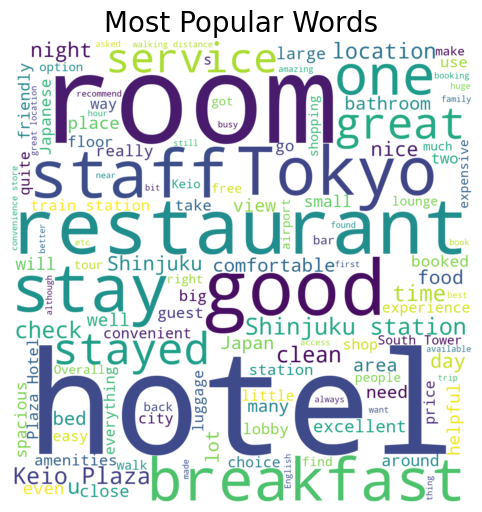

In [10]:
# Create and display a word cloud 

from wordcloud import WordCloud
import matplotlib.pyplot as plt
wordlist= ' '.join(df['text'].tolist())

plt.rcParams['figure.figsize']=(8,6)
wordcloud= WordCloud(background_color='white',width=1200,height=1200,max_words=121).generate(wordlist)
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Most Popular Words',fontsize=20)
plt.axis('off')
plt.show()

In [11]:
print ('Viewing first sample of a document')
df['text'].iloc[0]

Viewing first sample of a document


"Gate1 Tours uses this hotel in their program and we arrived a day early to acclimate.  We received a South Tower room for the first night and it was good sized, however dated and older.  The second night we had to move to the Main Tower Gate1 rooms and it was much smaller.  Staff overall were great, the Glass Dining Room had a great buffet with Western and Japanese breakfast options.  All the staff were fantastic, this the greatest attribute of the hotel.  Had dinner at the Tempura Restaurant, small intimate, great service and good food albeit expensive.  We ate there because we just arrived and didn't feel like exploring. The greatest attribute however was the location near shopping train station and restaurants.  Bottom line, older hotel with really good service throughout and great location, however quite pricey for actual room."

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1603 entries, 0 to 2493
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   text       1603 non-null   object
 1   sentiment  1603 non-null   object
dtypes: object(2)
memory usage: 37.6+ KB


In [13]:
df['sentiment'].value_counts()

sentiment
Positive    1256
Neutral      195
Negative     152
Name: count, dtype: int64

### Text Data Cleansing
<hr>

Noted Considerations:
- Lowercasing
- Removing punctuation
- Special Characters and Numbers
- Loaded list of known stopwords
- Stemming / Lemmatization / None

In [14]:
# Check for duplicates
duplicate_rows = df[df.duplicated('text')]

# Display the duplicate rows
print("Duplicate Rows: ")
print(duplicate_rows)

Duplicate Rows: 
Empty DataFrame
Columns: [text, sentiment]
Index: []


Stopwords

In [15]:
# predefined list of stopwords
stop_words = set(stopwords.words('english'))
print(stop_words) 

{'myself', "she's", 'over', 'by', 'it', "should've", 'now', 'her', 'while', 'this', 'm', 'couldn', 'am', 'more', "wouldn't", 'same', 'won', 'isn', 'being', 'no', "don't", 'about', "haven't", 'into', 'the', 'you', 'why', 'that', 'yours', 'then', 'themselves', 'his', 'have', "weren't", 'or', 'there', 'up', 'a', 'did', 'our', 'where', 'below', 'when', 'hasn', 'any', 'at', 'in', 'been', 'other', 'was', 'weren', 'should', 'and', 'doing', 'do', 'we', 'will', 'so', 'to', "doesn't", 'ours', 'haven', 'because', 'wouldn', 'off', 'once', 'didn', 'hadn', 'before', 'on', 'having', 'how', 'are', 'don', 'such', 'all', 'whom', 've', 'both', 'theirs', 'above', 'o', 'its', 'between', 'against', 'during', "mightn't", 'too', 'yourself', 'each', 'just', 'very', 'aren', 'll', 'an', "hasn't", 'mightn', 'but', 'were', 'herself', 'which', "you'd", 'ma', 'after', "it's", "you're", 'through', 'again', "hadn't", 'out', 'few', 'had', 'y', 'from', 'than', 'yourselves', 'here', 'most', 'as', 'is', "needn't", "you've

In [16]:
# Data Preprocessing
def pre_process(text):
    
    # lowercase
    text=text.lower()
    
    #remove tags
    text=re.sub("</?.*?>"," <> ",text)
    
    # remove special characters and digits
    text=re.sub("(\\d|\\W|_)+"," ",text)
    
    return text

# Remove stop words
def remove_stopwords(text):
    tokens = word_tokenize(text)
    filtered_tokens = [w for w in tokens if w not in stop_words and len(w) > 2]  # Remove short words
    return " ".join(filtered_tokens)


processed_text= df['text'].apply(lambda x:remove_stopwords(pre_process(x)))

In [17]:
print('initial: \n',df['text'].head())
print('cleaned: \n',processed_text.head())

initial: 
 0    Gate1 Tours uses this hotel in their program a...
1    Excellent customer service and great location ...
2    We have stayed here before. It is very well lo...
3    Nice hotel in a great location to explore Toky...
4    the whole club lounge staff and manager needs ...
Name: text, dtype: object
cleaned: 
 0    gate tours uses hotel program arrived day earl...
1    excellent customer service great location mins...
2    stayed well located lovely clean exceptionally...
3    nice hotel great location explore tokyo busy l...
4    whole club lounge staff manager needs replaced...
Name: text, dtype: object


This step is taken to clean and standardize text by removing noise (e.g., tags, special characters), ensuring consistency (lowercasing), focusing on key words by filtering out stopwords and short words, and improving accuracy for extracting meaningful patterns in ARM and sentiment analysis.

Tokenization

In [18]:
# Tokenize the text
def tokenize_text(text):
    tokens = word_tokenize(text)
    tokens = [token.strip() for token in tokens]
    return tokens

tokenized = processed_text.apply(lambda x: tokenize_text(x))

print('initial: \n',processed_text.head())
print('tokenized: \n',tokenized.head())

initial: 
 0    gate tours uses hotel program arrived day earl...
1    excellent customer service great location mins...
2    stayed well located lovely clean exceptionally...
3    nice hotel great location explore tokyo busy l...
4    whole club lounge staff manager needs replaced...
Name: text, dtype: object
tokenized: 
 0    [gate, tours, uses, hotel, program, arrived, d...
1    [excellent, customer, service, great, location...
2    [stayed, well, located, lovely, clean, excepti...
3    [nice, hotel, great, location, explore, tokyo,...
4    [whole, club, lounge, staff, manager, needs, r...
Name: text, dtype: object


This step is taken to tokenize the preprocessed text, splitting it into individual words (tokens) for easier analysis. Tokenization helps in tasks like identifying frequent terms and applying association rule mining.
The transformation from raw text to tokens allows for more structured text analysis by focusing on individual words or phrases.

In [19]:
# Lemmatize the text
def lemmatize_text(text):
    lemmatizer = WordNetLemmatizer()
    lemmatized_text = [lemmatizer.lemmatize(word) for word in text]
    return lemmatized_text

lemmatized = tokenized.apply(lambda x: lemmatize_text(x))

print('initial: \n',tokenized.head())
print('lemmatized: \n',lemmatized.head())

initial: 
 0    [gate, tours, uses, hotel, program, arrived, d...
1    [excellent, customer, service, great, location...
2    [stayed, well, located, lovely, clean, excepti...
3    [nice, hotel, great, location, explore, tokyo,...
4    [whole, club, lounge, staff, manager, needs, r...
Name: text, dtype: object
lemmatized: 
 0    [gate, tour, us, hotel, program, arrived, day,...
1    [excellent, customer, service, great, location...
2    [stayed, well, located, lovely, clean, excepti...
3    [nice, hotel, great, location, explore, tokyo,...
4    [whole, club, lounge, staff, manager, need, re...
Name: text, dtype: object


Why Lemmatization over Stemming?

- Preserves Meaning: Lemmatization reduces words to their base or dictionary form (e.g., running → run), ensuring the resulting word is meaningful, unlike stemming (running → runn).
- Context-Aware: Lemmatization considers the word’s context and part of speech, providing more accurate results.
- Better for Text Analysis: It maintains grammatical correctness and improves the quality of insights in tasks like Association Rule Mining and sentiment analysis.

This step is taken to lemmatize tokens, converting them to their base or dictionary form (e.g., arrived → arrive). Lemmatization helps maintain word meaning and improves text consistency for analysis.
Lemmatized text ensures that variations of words are treated as the same token, enhancing tasks like word frequency analysis and Association Rule Mining

In [24]:
df['processed_text']= processed_text.values
df['tokenized'] = tokenized.apply(lambda x: ' '.join(x))
df['lemmatized'] = lemmatized.apply(lambda x: ' '.join(x))


In [25]:
df.head()

,text,sentiment,processed_text,tokenized,lemmatized
0,Gate1 Tours uses this hotel in their program a...,Neutral,gate tours uses hotel program arrived day earl...,gate tours uses hotel program arrived day earl...,gate tour us hotel program arrived day early a...
1,Excellent customer service and great location ...,Positive,excellent customer service great location mins...,excellent customer service great location mins...,excellent customer service great location min ...
2,We have stayed here before. It is very well lo...,Positive,stayed well located lovely clean exceptionally...,stayed well located lovely clean exceptionally...,stayed well located lovely clean exceptionally...
3,Nice hotel in a great location to explore Toky...,Positive,nice hotel great location explore tokyo busy l...,nice hotel great location explore tokyo busy l...,nice hotel great location explore tokyo busy l...
4,the whole club lounge staff and manager needs ...,Negative,whole club lounge staff manager needs replaced...,whole club lounge staff manager needs replaced...,whole club lounge staff manager need replaced ...


appending everything into our dataframe

### Text Data Transformation
<hr>

- Transform the text data using Bag of Word and TF-IDF techniques.

Bag of Word

In [26]:
index, value= [], []

In [27]:
vectorizer = CountVectorizer(max_df=0.15)
vectorizer.fit(tokenized.apply(lambda x: ' '.join(x)))

print (f'Number of text features (no stemming/lemmatization):', len(vectorizer.get_feature_names_out()))

index.append('No Preprocessing')
value.append(len(vectorizer.get_feature_names_out()))

Number of text features (no stemming/lemmatization): 7502


In [28]:
vectorizer = CountVectorizer(max_df=0.15)
vectorizer.fit(lemmatized.apply(lambda x: ' '.join(x)))
print ('After lemmatization:', len(vectorizer.get_feature_names_out()))

index.append('Lemmatization')
value.append(len(vectorizer.get_feature_names_out()))

After lemmatization: 6667


Purpose:
To compare the number of text features before and after lemmatization using CountVectorizer. This shows how lemmatization reduces feature count by consolidating word variations (e.g., arrives, arriving → arrive).

Insight:
- Before Lemmatization: 7502 features, indicating redundant word forms.
- After Lemmatization: Reduced to 6667 features, improving consistency and reducing noise for better text analysis.

In [29]:
vectorizer = CountVectorizer(max_df=0.15, max_features=5000)
counter= vectorizer.fit_transform(lemmatized.apply(lambda x: ' '.join(x)))
counter.shape

(1603, 5000)

In [30]:
sum_words= counter.sum(axis= 0)
words_freq= [(word, sum_words[0, idx]) for word, idx in vectorizer.vocabulary_.items()]
words_freq= sorted(words_freq, key= lambda x: x[1], reverse= True)

In [31]:
print('The highest frequency words:')
words_freq[:20] 

The highest frequency words:


[('lounge', 305),
 ('really', 289),
 ('could', 289),
 ('store', 288),
 ('big', 279),
 ('need', 275),
 ('first', 264),
 ('two', 262),
 ('easy', 262),
 ('booked', 254),
 ('small', 251),
 ('back', 248),
 ('tour', 239),
 ('quite', 234),
 ('lobby', 231),
 ('recommend', 230),
 ('convenient', 230),
 ('shopping', 227),
 ('shop', 223),
 ('building', 220)]

In [32]:
print('The lowest frequency words:') 
words_freq[-20:] 

The lowest frequency words:


[('www', 1),
 ('showuserreviews', 1),
 ('clearing', 1),
 ('stillness', 1),
 ('broader', 1),
 ('yuzawaya', 1),
 ('crowed', 1),
 ('congregate', 1),
 ('charme', 1),
 ('capability', 1),
 ('alive', 1),
 ('stock', 1),
 ('cast', 1),
 ('vey', 1),
 ('voluntarily', 1),
 ('chased', 1),
 ('bordering', 1),
 ('attributed', 1),
 ('soaked', 1),
 ('spit', 1)]

In [33]:
feature_names= np.array(vectorizer.get_feature_names_out())
counter= pd.DataFrame(counter.toarray(), columns= feature_names)
counter

,abd,ability,abiste,abit,able,abound,abroad,abrupt,abscence,absolute,...,私はお酒を飲まず,結果係我地為呢個,美しくありがとう,而不穫退款,西側だったので夕日が本当に綺麗でした,連泊しました,静かに仕事がしたかったため,頻繁に接続が切られていました,驚惶酒店,體驗花咗hkd
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1598,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1599,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1600,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1601,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


TF-IDF

In [34]:
tfidf_transformer= TfidfTransformer()
review_tfidf= tfidf_transformer.fit_transform(counter)

In [35]:
feature_names= np.array(vectorizer.get_feature_names_out())

In [36]:
df_tfidf= pd.DataFrame(review_tfidf.toarray(), columns= feature_names)
df_tfidf

,abd,ability,abiste,abit,able,abound,abroad,abrupt,abscence,absolute,...,私はお酒を飲まず,結果係我地為呢個,美しくありがとう,而不穫退款,西側だったので夕日が本当に綺麗でした,連泊しました,静かに仕事がしたかったため,頻繁に接続が切られていました,驚惶酒店,體驗花咗hkd
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1598,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1599,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1600,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1601,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


To convert word frequencies into TF-IDF scores, which measure how important a word is relative to the document and the entire corpus. This reduces the weight of common words while emphasizing rare yet significant ones.

Insight:
- Common words like "ability" and "able" are down-weighted by their TF-IDF scores.
- Sparse Matrix: Most values are 0, indicating words are present in only a few documents, making the data suitable for feature selection and clustering.

In [37]:
sorted_by_idf = np.argsort(tfidf_transformer.idf_)
print("Features with lowest idf:\n{}".format(
       feature_names[sorted_by_idf[:100]]))

Features with lowest idf:
['need' 'big' 'really' 'store' 'could' 'small' 'easy' 'first' 'recommend'
 'shopping' 'convenient' 'back' 'booked' 'two' 'lounge' 'amenity' 'shop'
 'lobby' 'quite' 'building' 'size' 'walking' 'near' 'definitely' 'choice'
 'standard' 'however' 'tour' 'experience' 'option' 'guest' 'little'
 'south' 'trip' 'english' 'main' 'city' 'access' 'price' 'long' 'people'
 'distance' 'right' 'min' 'take' 'much' 'next' 'bit' 'within' 'way'
 'expensive' 'line' 'huge' 'use' 'front' 'everything' 'make' 'shuttle'
 'every' 'desk' 'subway' 'convenience' 'hour' 'bar' 'overall' 'away'
 'thing' 'best' 'find' 'busy' 'western' 'star' 'visit' 'morning' 'better'
 'limousine' 'got' 'amazing' 'different' 'short' 'always' 'made' 'staying'
 'want' 'luggage' 'family' 'found' 'drink' 'although' 'come' 'old' 'offer'
 'early' 'still' 'quiet' 'book' 'stop' 'level' 'etc' 'quality']


#### Text Data Understanding

In [38]:
def extract_keywords(tfidf_matrix, feature_names, topn=5):
    results = []
    for idx, row in enumerate(tfidf_matrix):
        temp = pd.DataFrame(zip(row.indices, row.data), columns=['feature_number', 'tf_idf'])
        temp.sort_values('tf_idf', ascending=False, inplace=True)
        
        topn_items = temp[:topn]
        tf_idf = []
        word = []
        for _, row in topn_items.iterrows():
            fname = feature_names[int(row['feature_number'])]
            word.append(fname)
            tf_idf.append(round(row['tf_idf'], 3))
            
        result = dict(zip(word, tf_idf))
        results.append(result)
    
    return results

# Extract feature names
feature_names = vectorizer.get_feature_names_out()

# Convert tfidf matrix to CSC format
tfidf_matrix = review_tfidf.tocsc()

# Extract keywords
keywords = extract_keywords(tfidf_matrix, feature_names, topn=5)

# Print the keywords for the first 5 items
for i in range(5):
    print("Keywords from document: ")
    for word, score in keywords[i].items():
        print(f" {word}: {score}")

Keywords from document: 
 attribute: 0.381
 greatest: 0.346
 gate: 0.275
 older: 0.267
 however: 0.238
Keywords from document: 
 direction: 0.258
 customer: 0.234
 reception: 0.204
 provided: 0.203
 look: 0.203
Keywords from document: 
 exceptionally: 0.449
 pricey: 0.32
 value: 0.316
 court: 0.315
 west: 0.296
Keywords from document: 
 lounge: 0.568
 presented: 0.361
 nicely: 0.314
 thank: 0.301
 explore: 0.294
Keywords from document: 
 know: 0.343
 club: 0.323
 simplest: 0.318
 lie: 0.261
 lounge: 0.256


High TF-IDF scores indicate unique and relevant keywords in each review (e.g., lounge, direction, exceptionally).
These keywords help summarize key topics in reviews and identify trends across multiple documents.

In [39]:
keywords

[{'attribute': 0.381,
  'greatest': 0.346,
  'gate': 0.275,
  'older': 0.267,
  'however': 0.238},
 {'direction': 0.258,
  'customer': 0.234,
  'reception': 0.204,
  'provided': 0.203,
  'look': 0.203},
 {'exceptionally': 0.449,
  'pricey': 0.32,
  'value': 0.316,
  'court': 0.315,
  'west': 0.296},
 {'lounge': 0.568,
  'presented': 0.361,
  'nicely': 0.314,
  'thank': 0.301,
  'explore': 0.294},
 {'know': 0.343,
  'club': 0.323,
  'simplest': 0.318,
  'lie': 0.261,
  'lounge': 0.256},
 {'loved': 0.296,
  'anytime': 0.232,
  'gripe': 0.201,
  'upscale': 0.197,
  'atm': 0.194},
 {'awesome': 0.246,
  'average': 0.207,
  'snd': 0.186,
  'timely': 0.186,
  'brief': 0.176},
 {'failed': 0.44,
  'hand': 0.326,
  'door': 0.253,
  'accidentally': 0.25,
  'causing': 0.25},
 {'club': 0.395,
  'planning': 0.284,
  'outstanding': 0.273,
  'suggest': 0.268,
  'ground': 0.259},
 {'paid': 0.34,
  'missed': 0.312,
  'refused': 0.3,
  'unfamiliar': 0.203,
  'kindness': 0.193},
 {'lively': 0.465,
  'yoyo

In [40]:
df['keywords']=keywords
df.head()

,text,sentiment,processed_text,tokenized,lemmatized,keywords
0,Gate1 Tours uses this hotel in their program a...,Neutral,gate tours uses hotel program arrived day earl...,gate tours uses hotel program arrived day earl...,gate tour us hotel program arrived day early a...,"{'attribute': 0.381, 'greatest': 0.346, 'gate'..."
1,Excellent customer service and great location ...,Positive,excellent customer service great location mins...,excellent customer service great location mins...,excellent customer service great location min ...,"{'direction': 0.258, 'customer': 0.234, 'recep..."
2,We have stayed here before. It is very well lo...,Positive,stayed well located lovely clean exceptionally...,stayed well located lovely clean exceptionally...,stayed well located lovely clean exceptionally...,"{'exceptionally': 0.449, 'pricey': 0.32, 'valu..."
3,Nice hotel in a great location to explore Toky...,Positive,nice hotel great location explore tokyo busy l...,nice hotel great location explore tokyo busy l...,nice hotel great location explore tokyo busy l...,"{'lounge': 0.568, 'presented': 0.361, 'nicely'..."
4,the whole club lounge staff and manager needs ...,Negative,whole club lounge staff manager needs replaced...,whole club lounge staff manager needs replaced...,whole club lounge staff manager need replaced ...,"{'know': 0.343, 'club': 0.323, 'simplest': 0.3..."


In [41]:
keyword_list = []
keyword_list = []
for keyword in keywords:  
    res = " ".join(keyword)  
    keyword_list.append(res)

df['clean_keywords'] = keyword_list
df.head()

,text,sentiment,processed_text,tokenized,lemmatized,keywords,clean_keywords
0,Gate1 Tours uses this hotel in their program a...,Neutral,gate tours uses hotel program arrived day earl...,gate tours uses hotel program arrived day earl...,gate tour us hotel program arrived day early a...,"{'attribute': 0.381, 'greatest': 0.346, 'gate'...",attribute greatest gate older however
1,Excellent customer service and great location ...,Positive,excellent customer service great location mins...,excellent customer service great location mins...,excellent customer service great location min ...,"{'direction': 0.258, 'customer': 0.234, 'recep...",direction customer reception provided look
2,We have stayed here before. It is very well lo...,Positive,stayed well located lovely clean exceptionally...,stayed well located lovely clean exceptionally...,stayed well located lovely clean exceptionally...,"{'exceptionally': 0.449, 'pricey': 0.32, 'valu...",exceptionally pricey value court west
3,Nice hotel in a great location to explore Toky...,Positive,nice hotel great location explore tokyo busy l...,nice hotel great location explore tokyo busy l...,nice hotel great location explore tokyo busy l...,"{'lounge': 0.568, 'presented': 0.361, 'nicely'...",lounge presented nicely thank explore
4,the whole club lounge staff and manager needs ...,Negative,whole club lounge staff manager needs replaced...,whole club lounge staff manager needs replaced...,whole club lounge staff manager need replaced ...,"{'know': 0.343, 'club': 0.323, 'simplest': 0.3...",know club simplest lie lounge


In [42]:
# Split the keywords into separate columns
df = df.join(df['clean_keywords'].str.split(" ", expand=True))

# Extract the new keyword columns (assuming the first 9 columns are not keywords)
keywords_df = df.iloc[:, 9:]

# Create an empty Series to store keywords
keywords_list = pd.Series(dtype='object')

# Concatenate keywords from each column into a single Series
keywords_list = pd.concat([keywords_df[col].dropna() for col in keywords_df], ignore_index=True)


# Count the occurrences of each keyword
keyword_counts = keywords_list.value_counts()

# Display the results
print(keyword_counts)
print(keywords_list.shape)

lounge         16
club           16
big            12
min            10
bar            10
               ..
thank           1
nationality     1
maker           1
powerful        1
portion         1
Name: count, Length: 2650, dtype: int64
(4808,)


In [43]:
keywords_list

0             gate
1        reception
2            value
3           nicely
4         simplest
           ...    
4803       portion
4804    chandelier
4805    disneyland
4806          five
4807        assist
Length: 4808, dtype: object

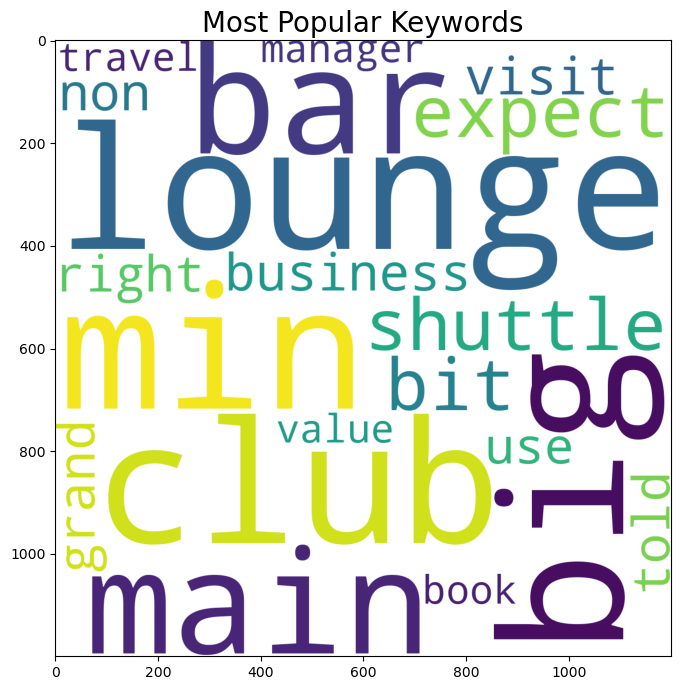

In [44]:
plt.rcParams['figure.figsize'] = (8,8)
wordcloud = WordCloud(background_color='white', width=1200,
                      height=1200, max_words=20).generate(str(keywords_list.value_counts().head(20)))
plt.imshow(wordcloud)
#plt.axis('off')
plt.title('Most Popular Keywords', fontsize=20)
plt.show()

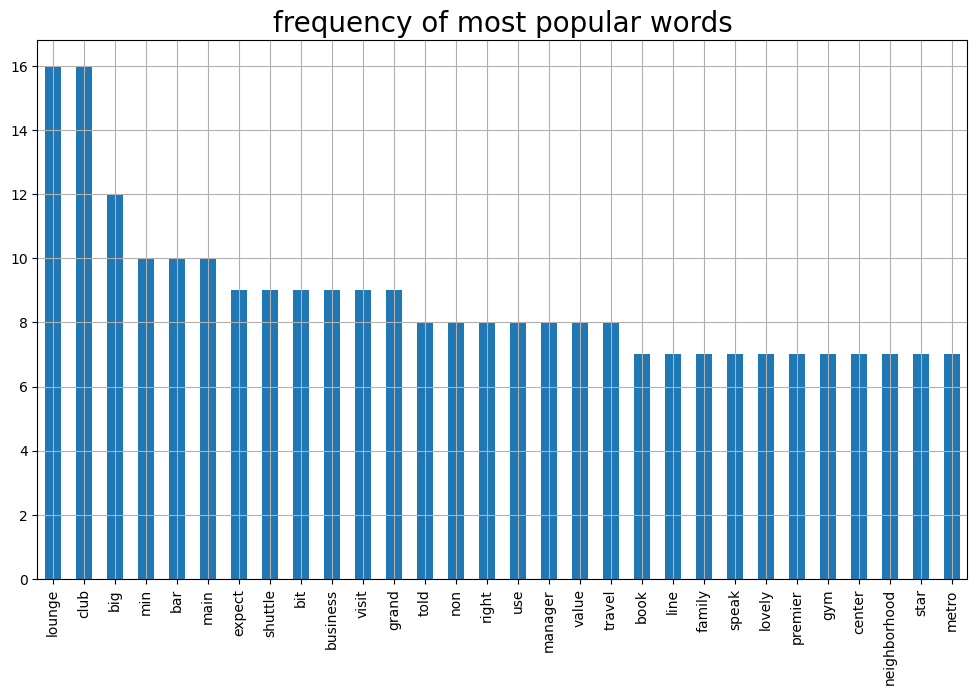

In [45]:
plt.figure(figsize=(12, 7))
keywords_list.value_counts().head(30).plot.bar()
plt.title('frequency of most popular words', fontsize=20)
plt.xticks(rotation=90)
plt.grid()
plt.show()

In [46]:
# Generate Tf-IDF Binary matrix
matrix=(df_tfidf>0).astype(bool)
matrix.head()

,abd,ability,abiste,abit,able,abound,abroad,abrupt,abscence,absolute,...,私はお酒を飲まず,結果係我地為呢個,美しくありがとう,而不穫退款,西側だったので夕日が本当に綺麗でした,連泊しました,静かに仕事がしたかったため,頻繁に接続が切られていました,驚惶酒店,體驗花咗hkd
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


#### Frequent Itemsets

Apriori is a popular algorithm for extracting frequent itemsets with applications in association rule learning. The apriori algorithm has been designed to operate on databases containing transactions, such as purchases by customers of a store. An itemset is considered as "frequent" if it meets a user-specified support threshold. For instance, if the support threshold is set to 0.01 (1%), a frequent itemset is defined as a set of items that occur together in at least 1% of all transactions in the database.

In [47]:
def clean_keywords_list(string):
 string = string.split(" ")
 return string
df["clean_keywords_list"] = df["clean_keywords"].apply(lambda x: clean_keywords_list(x))
df.head(10)

,text,sentiment,processed_text,tokenized,lemmatized,keywords,clean_keywords,0,1,2,3,4,clean_keywords_list
0,Gate1 Tours uses this hotel in their program a...,Neutral,gate tours uses hotel program arrived day earl...,gate tours uses hotel program arrived day earl...,gate tour us hotel program arrived day early a...,"{'attribute': 0.381, 'greatest': 0.346, 'gate'...",attribute greatest gate older however,attribute,greatest,gate,older,however,"[attribute, greatest, gate, older, however]"
1,Excellent customer service and great location ...,Positive,excellent customer service great location mins...,excellent customer service great location mins...,excellent customer service great location min ...,"{'direction': 0.258, 'customer': 0.234, 'recep...",direction customer reception provided look,direction,customer,reception,provided,look,"[direction, customer, reception, provided, look]"
2,We have stayed here before. It is very well lo...,Positive,stayed well located lovely clean exceptionally...,stayed well located lovely clean exceptionally...,stayed well located lovely clean exceptionally...,"{'exceptionally': 0.449, 'pricey': 0.32, 'valu...",exceptionally pricey value court west,exceptionally,pricey,value,court,west,"[exceptionally, pricey, value, court, west]"
3,Nice hotel in a great location to explore Toky...,Positive,nice hotel great location explore tokyo busy l...,nice hotel great location explore tokyo busy l...,nice hotel great location explore tokyo busy l...,"{'lounge': 0.568, 'presented': 0.361, 'nicely'...",lounge presented nicely thank explore,lounge,presented,nicely,thank,explore,"[lounge, presented, nicely, thank, explore]"
4,the whole club lounge staff and manager needs ...,Negative,whole club lounge staff manager needs replaced...,whole club lounge staff manager needs replaced...,whole club lounge staff manager need replaced ...,"{'know': 0.343, 'club': 0.323, 'simplest': 0.3...",know club simplest lie lounge,know,club,simplest,lie,lounge,"[know, club, simplest, lie, lounge]"
5,"While visiting Tokyo with family, I booked 3 r...",Positive,visiting tokyo family booked rooms keio plaza ...,visiting tokyo family booked rooms keio plaza ...,visiting tokyo family booked room keio plaza h...,"{'loved': 0.296, 'anytime': 0.232, 'gripe': 0....",loved anytime gripe upscale atm,loved,anytime,gripe,upscale,atm,"[loved, anytime, gripe, upscale, atm]"
6,Shinjuku Superior Stay!\n\nAfter a 10 plus hou...,Positive,shinjuku superior stay plus hour flight grand ...,shinjuku superior stay plus hour flight grand ...,shinjuku superior stay plus hour flight grand ...,"{'awesome': 0.246, 'average': 0.207, 'snd': 0....",awesome average snd timely brief,awesome,average,snd,timely,brief,"[awesome, average, snd, timely, brief]"
7,The hotels elevator was broken and when it clo...,Negative,hotels elevator broken closed accidentally doo...,hotels elevator broken closed accidentally doo...,hotel elevator broken closed accidentally door...,"{'failed': 0.44, 'hand': 0.326, 'door': 0.253,...",failed hand door accidentally causing,failed,hand,door,accidentally,causing,"[failed, hand, door, accidentally, causing]"
8,My husband and I really enjoyed our stay at th...,Positive,husband really enjoyed stay keio plaza locatio...,husband really enjoyed stay keio plaza locatio...,husband really enjoyed stay keio plaza locatio...,"{'club': 0.395, 'planning': 0.284, 'outstandin...",club planning outstanding suggest ground,club,planning,outstanding,suggest,ground,"[club, planning, outstanding, suggest, ground]"
9,The hotel lobby feels like an unwelcoming cent...,Negative,hotel lobby feels like unwelcoming central bus...,hotel lobby feels like unwelcoming central bus...,hotel lobby feel like unwelcoming central bus ...,"{'paid': 0.34, 'missed': 0.312, 'refused': 0.3...",paid missed refused unfamiliar kindness,paid,missed,refused,unfamiliar,kindness,"[paid, missed, refused, unfamiliar, kindness]"


In [48]:
#Apply Apriori Algorithm

frequent_itemsets=apriori(matrix,min_support=0.05, use_colnames=True)

frequent_itemsets

,support,itemsets
0,0.106675,(access)
1,0.056769,(across)
2,0.072364,(although)
3,0.077979,(always)
4,0.079850,(amazing)
...,...,...
182,0.058016,(year)
183,0.057392,"(building, government)"
184,0.074860,"(store, convenience)"
185,0.057392,"(front, desk)"


Purpose:
- To apply the Apriori algorithm for identifying frequent itemsets in hotel reviews based on a minimum support threshold (min_support=0.05). These itemsets represent combinations of words that appear together in at least 5% of the reviews.

Insight:
- Support: Proportion of documents containing the itemset.
- For example, {'access'} has a support of 0.1066, meaning it appears in around 10.66% of the reviews.
- This step helps in discovering patterns and co-occurring keywords, which can be used for generating association rules in the next phase.

In [49]:
# Apply association rules
rules_c = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.5)

if not rules_c.empty:
    print("Association Rules:")
    print(rules_c.head())
else:
    print("No rules found with the specified confidence threshold.")

Association Rules:
     antecedents    consequents  antecedent support  consequent support  \
0   (government)     (building)            0.066126            0.119775   
1        (store)  (convenience)            0.142857            0.088584   
2  (convenience)        (store)            0.088584            0.142857   
3        (front)         (desk)            0.096070            0.091703   
4         (desk)        (front)            0.091703            0.096070   

    support  confidence      lift  leverage  conviction  zhangs_metric  
0  0.057392    0.867925  7.246266  0.049472    6.664558       0.923034  
1  0.074860    0.524017  5.915493  0.062205    1.914810       0.969444  
2  0.074860    0.845070  5.915493  0.062205    5.532468       0.911716  
3  0.057392    0.597403  6.514533  0.048582    2.256092       0.936463  
4  0.057392    0.625850  6.514533  0.048582    2.415959       0.931961  


Purpose:
- To generate association rules from frequent itemsets using a confidence threshold of 0.5. These rules help identify relationships between co-occurring terms in hotel reviews.

Explanation of Metrics:
- Antecedents → Consequents: Items that appear together in reviews. For example, {government} → {building} indicates that "government" often co-occurs with "building".
- Support: Proportion of reviews containing the entire rule.
- Confidence: Likelihood that the consequent appears when the antecedent is present. For instance, {government} → {building} has a confidence of 0.867925 (86.79%).
- Lift: Measures how much more likely the rule is compared to random chance. A lift > 1 indicates a strong association.
- Conviction and Leverage: Additional metrics for rule strength.
Insight:
- These rules help identify patterns in how certain terms co-occur in reviews, providing actionable insights for understanding customer feedback. For example, {store} → {convenience} suggests that customers mentioning "store" are likely talking about its "convenience".

In [50]:
rules_c.sort_values('confidence', ascending = False, inplace = True)
rules_c.head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(government),(building),0.066126,0.119775,0.057392,0.867925,7.246266,0.049472,6.664558,0.923034
2,(convenience),(store),0.088584,0.142857,0.074860,0.845070,5.915493,0.062205,5.532468,0.911716
5,(distance),(walking),0.101684,0.117280,0.084217,0.828221,7.061904,0.072292,5.138691,0.955561
6,(walking),(distance),0.117280,0.101684,0.084217,0.718085,7.061904,0.072292,3.186478,0.972443
4,(desk),(front),0.091703,0.096070,0.057392,0.625850,6.514533,0.048582,2.415959,0.931961


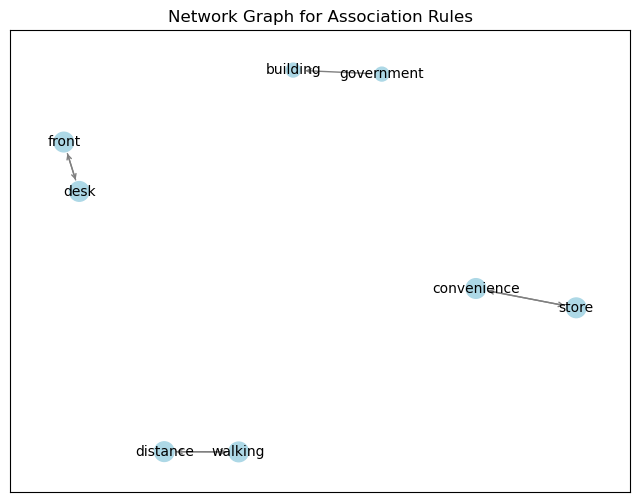

In [51]:
G = nx.DiGraph()

# Add edges with weights based on confidence
for _, row in rules_c.iterrows():
    G.add_edge(', '.join(row['antecedents']),
               ', '.join(row['consequents']),
               weight=row['confidence'])

# Set node sizes based on the degree
node_size = [G.degree(node) * 100 for node in G.nodes()]

# Draw the graph
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G, k=0.5)  # For a better layout
nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color='lightblue')
nx.draw_networkx_edges(G, pos, arrowstyle='->', arrowsize=8, edge_color='gray')
nx.draw_networkx_labels(G, pos, font_size=10)

plt.title("Network Graph for Association Rules")
plt.show()


Purpose:
-T his network graph visualizes the association rules, where:

- Nodes represent terms in the antecedents and consequents.
- Edges (arrows) represent the direction of the rule (antecedent → consequent).
- Node proximity indicates co-occurrence strength.
Insight:
- Groups like convenience and store are closely related, suggesting a strong association.
- front and desk form a separate cluster, reflecting another key topic in the reviews.
- This graph highlights distinct patterns and associations, making it easier to identify common themes in customer feedback.

Since the dataset is 90% positive reviews, the analysis will focus on subsets of negative and neutral reviews for more detailed insights and balanced exploration.

### Negative Reviews

In [52]:
#Filter out all negative keywords 
sorted_values = df.query('sentiment == "Negative"')['clean_keywords_list']

keyword_neg = []
for list in sorted_values:
    keyword_neg.append(list)

keyword_neg = np.array(keyword_neg)

te_neg = TransactionEncoder()
neg_encoded = te_neg.fit_transform(keyword_neg)
neg_encoded = pd.DataFrame(
neg_encoded, columns=te_neg.columns_)


neg_encoded.shape

(152, 627)

Text(0.5, 1.0, 'Most Popular Keywords (Negative)')

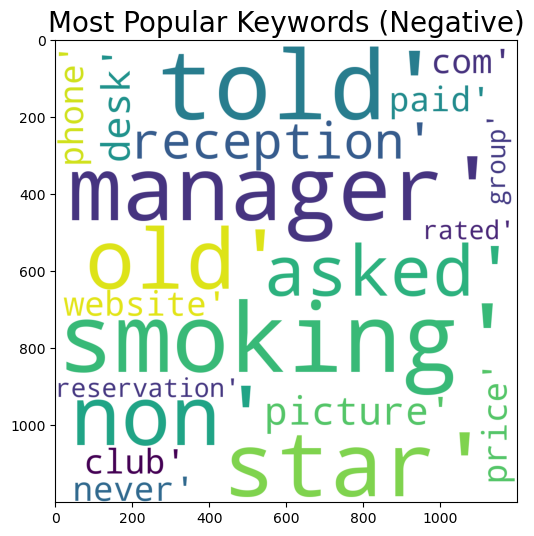

In [53]:
## Word cloud for Negative Reviews

plt.rcParams['figure.figsize'] = (8,6)
wordcloud = WordCloud(background_color='white', width=1200,
                      height=1200, max_words=20).generate(str(keyword_neg))
plt.imshow(wordcloud)
plt.title('Most Popular Keywords (Negative)', fontsize=20)
#plt.axis('off')

In [54]:
frequent_keywords_neg = apriori(neg_encoded, min_support = 0.01, use_colnames = True)

rules_c_neg = association_rules(frequent_keywords_neg, metric="confidence", min_threshold=0.5)
rules_c_neg.sort_values('confidence', ascending = False, inplace = True)

rules_c_neg[ (rules_c_neg['lift'] > 5)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
1,(average),(group),0.013158,0.019737,0.013158,1.000000,50.666667,0.012898,inf,0.993333
3,(cheap),(com),0.013158,0.019737,0.013158,1.000000,50.666667,0.012898,inf,0.993333
4,(front),(desk),0.013158,0.026316,0.013158,1.000000,38.000000,0.012812,inf,0.986667
10,(request),(smoking),0.013158,0.052632,0.013158,1.000000,19.000000,0.012465,inf,0.960000
7,(non),(smoking),0.039474,0.052632,0.032895,0.833333,15.833333,0.030817,5.684211,0.975342
0,(group),(average),0.019737,0.013158,0.013158,0.666667,50.666667,0.012898,2.960526,1.000000
2,(com),(cheap),0.019737,0.013158,0.013158,0.666667,50.666667,0.012898,2.960526,1.000000
9,(price),(star),0.019737,0.046053,0.013158,0.666667,14.476190,0.012249,2.861842,0.949664
8,(smoking),(non),0.052632,0.039474,0.032895,0.625000,15.833333,0.030817,2.561404,0.988889
5,(desk),(front),0.026316,0.013158,0.013158,0.500000,38.000000,0.012812,1.973684,1.000000


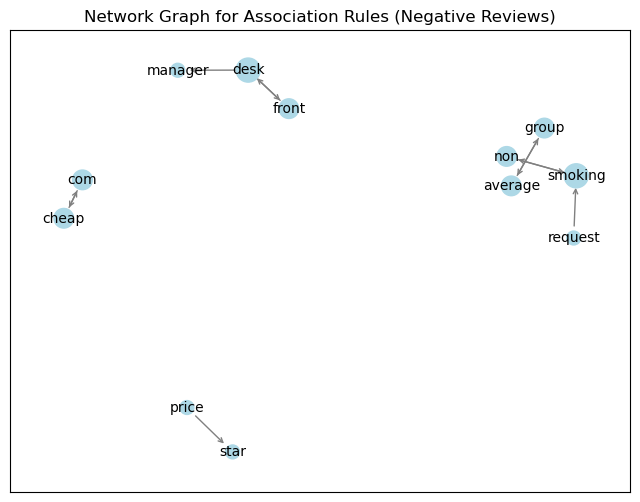

In [55]:
G = nx.DiGraph()

# Add edges with weights based on confidence
for _, row in rules_c_neg.iterrows():
    G.add_edge(', '.join(row['antecedents']),
               ', '.join(row['consequents']),
               weight=row['confidence'])

# Set node sizes based on the degree
node_size = [G.degree(node) * 100 for node in G.nodes()]

# Draw the graph
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G, k=0.5)  # For a better layout
nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color='lightblue')
nx.draw_networkx_edges(G, pos, arrowstyle='->', arrowsize=8, edge_color='gray')
nx.draw_networkx_labels(G, pos, font_size=10)

plt.title("Network Graph for Association Rules (Negative Reviews)")
plt.show()


### Neutral Reviews

In [56]:
#Filter out all neutral reviews
sorted_values = df.query('sentiment == "Neutral"')['clean_keywords_list']

keyword_n= []
for i in sorted_values:
    keyword_n.append(i)

keyword_n = np.array(keyword_n)

te_n = TransactionEncoder()
n_encoded = te_n.fit_transform(keyword_n)
n_encoded = pd.DataFrame(
n_encoded, columns=te_n.columns_)

# 
n_encoded.shape

(195, 783)

Text(0.5, 1.0, 'Most Popular Keywords (Neutral)')

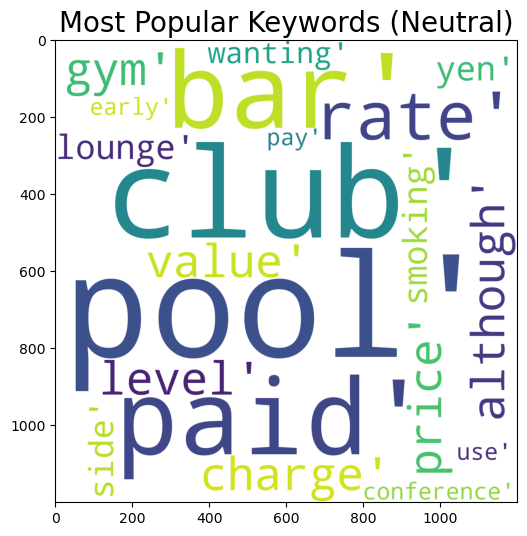

In [57]:
## Word cloud for Neutral Reviews

plt.rcParams['figure.figsize'] = (8,6)
wordcloud = WordCloud(background_color='white', width=1200,
                      height=1200, max_words=20).generate(str(keyword_n))
plt.imshow(wordcloud)
plt.title('Most Popular Keywords (Neutral)', fontsize=20)
#plt.axis('off')

In [58]:
frequent_keywords_n = apriori(n_encoded, min_support = 0.01, use_colnames = True)

rules_c_b = association_rules(frequent_keywords_n, metric="confidence", min_threshold=0.1)
rules_c_b.sort_values('confidence', ascending = False, inplace = True)

rules_c_b[ (rules_c_b['lift'] > 5)]

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
1,(extra),(paid),0.010256,0.020513,0.010256,1.000000,48.750000,0.010046,inf,0.989637
2,(kitty),(hello),0.010256,0.010256,0.010256,1.000000,97.500000,0.010151,inf,1.000000
3,(hello),(kitty),0.010256,0.010256,0.010256,1.000000,97.500000,0.010151,inf,1.000000
5,(luxe),(lounge),0.010256,0.020513,0.010256,1.000000,48.750000,0.010046,inf,0.989637
8,(tattoo),(pool),0.010256,0.041026,0.010256,1.000000,24.375000,0.009836,inf,0.968912
6,(outdated),(star),0.015385,0.015385,0.010256,0.666667,43.333333,0.010020,2.953846,0.992188
7,(star),(outdated),0.015385,0.015385,0.010256,0.666667,43.333333,0.010020,2.953846,0.992188
10,(use),(pool),0.015385,0.041026,0.010256,0.666667,16.250000,0.009625,2.876923,0.953125
0,(paid),(extra),0.020513,0.010256,0.010256,0.500000,48.750000,0.010046,1.979487,1.000000
4,(lounge),(luxe),0.020513,0.010256,0.010256,0.500000,48.750000,0.010046,1.979487,1.000000


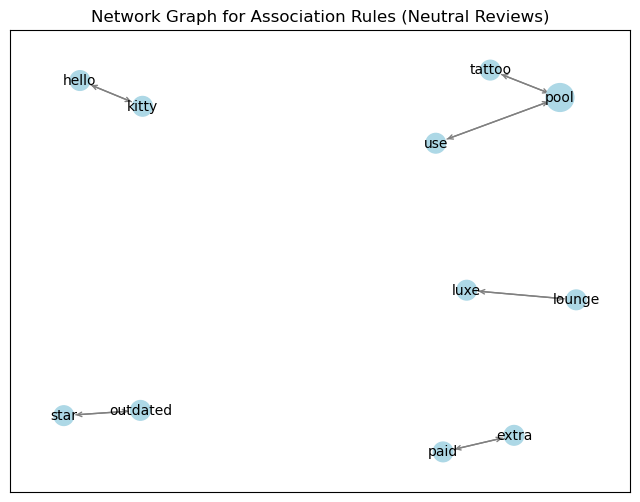

In [59]:
G = nx.DiGraph()

# Add edges with weights based on confidence
for _, row in rules_c_b.iterrows():
    G.add_edge(', '.join(row['antecedents']),
               ', '.join(row['consequents']),
               weight=row['confidence'])

# Set node sizes based on the degree
node_size = [G.degree(node) * 100 for node in G.nodes()]

# Draw the graph
plt.figure(figsize=(8, 6))
pos = nx.spring_layout(G, k=0.5)  # For a better layout
nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color='lightblue')
nx.draw_networkx_edges(G, pos, arrowstyle='->', arrowsize=8, edge_color='gray')
nx.draw_networkx_labels(G, pos, font_size=10)

plt.title("Network Graph for Association Rules (Neutral Reviews)")
plt.show()
